Стандартизация
https://practicum.yandex.ru/blog/standartizaciya-dannyh/#sovet-eksperta

Кодирование категориальных данных
https://olegtalks.ru/tpost/4r6m1f7xk1-sposobi-kodirovaniya-kategorialnih-danni

EDA
https://pythontalk.olegtalks.ru/eda_instruments#0e7k

In [194]:
import pandas as pd
import numpy as np
import seaborn as sns
import category_encoders as ce
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_validate, KFold, train_test_split, learning_curve, permutation_test_score, cross_val_predict
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
import missingno as msno
import matplotlib.pyplot as plt

In [164]:
df_ = pd.read_csv(r'data/financials.csv')
df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505 entries, 0 to 504
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Symbol          505 non-null    object 
 1   Name            505 non-null    object 
 2   Sector          505 non-null    object 
 3   Price           505 non-null    float64
 4   Price/Earnings  503 non-null    float64
 5   Dividend Yield  505 non-null    float64
 6   Earnings/Share  505 non-null    float64
 7   52 Week Low     505 non-null    float64
 8   52 Week High    505 non-null    float64
 9   Market Cap      505 non-null    float64
 10  EBITDA          505 non-null    float64
 11  Price/Sales     505 non-null    float64
 12  Price/Book      497 non-null    float64
 13  SEC Filings     505 non-null    object 
dtypes: float64(10), object(4)
memory usage: 55.4+ KB


In [165]:
df_.describe()

,Price,Price/Earnings,Dividend Yield,Earnings/Share,52 Week Low,52 Week High,Market Cap,EBITDA,Price/Sales,Price/Book
count,505.000000,503.000000,505.000000,505.000000,505.000000,505.000000,5.050000e+02,5.050000e+02,505.000000,497.000000
mean,103.830634,24.808390,1.895953,3.753743,122.623832,83.536616,4.923944e+10,3.590328e+09,3.941705,14.453179
std,134.427636,41.241081,1.537214,5.689036,155.362140,105.725473,9.005017e+10,6.840544e+09,3.460110,89.660508
min,2.820000,-251.530000,0.000000,-28.010000,6.590000,2.800000,2.626102e+09,-5.067000e+09,0.153186,0.510000
25%,46.250000,15.350000,0.794834,1.490000,56.250000,38.430000,1.273207e+10,7.739320e+08,1.629490,2.020000
50%,73.920000,19.450000,1.769255,2.890000,86.680000,62.850000,2.140095e+10,1.614399e+09,2.896440,3.400000
75%,116.540000,25.750000,2.781114,5.140000,140.130000,96.660000,4.511968e+10,3.692749e+09,4.703842,6.110000
max,1806.060000,520.150000,12.661196,44.090000,2067.990000,1589.000000,8.095080e+11,7.938600e+10,20.094294,1403.380000


In [166]:
df_.isna().sum()

Symbol            0
Name              0
Sector            0
Price             0
Price/Earnings    2
Dividend Yield    0
Earnings/Share    0
52 Week Low       0
52 Week High      0
Market Cap        0
EBITDA            0
Price/Sales       0
Price/Book        8
SEC Filings       0
dtype: int64

In [167]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df_, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 723.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Используем библиотеку missingno для визуализации пропусков

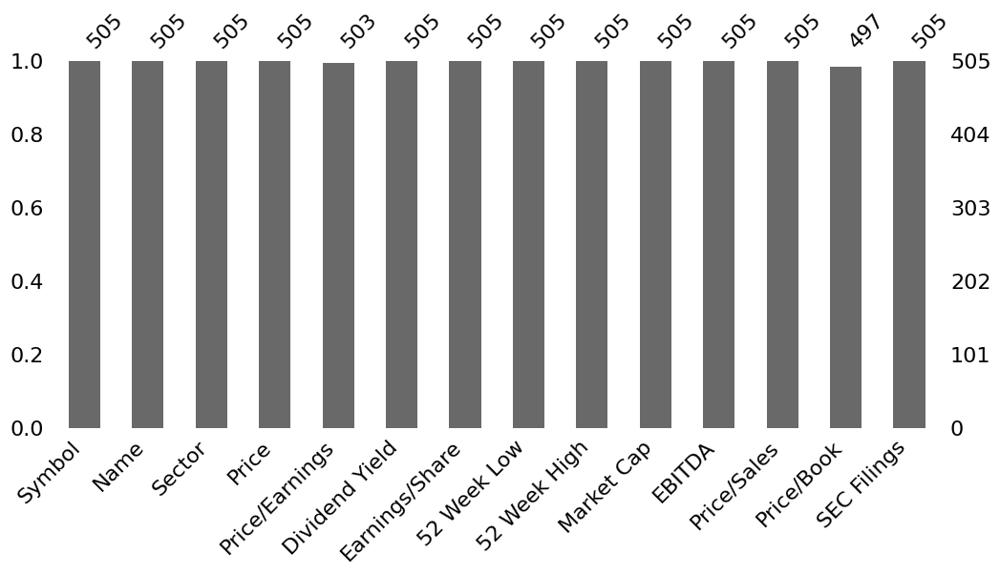

In [168]:
%matplotlib inline
msno.bar(df_, figsize=(12,5))
plt.show()

Матричный график - демонстрирует, где в структуре находятся пропуски.

<Axes: >

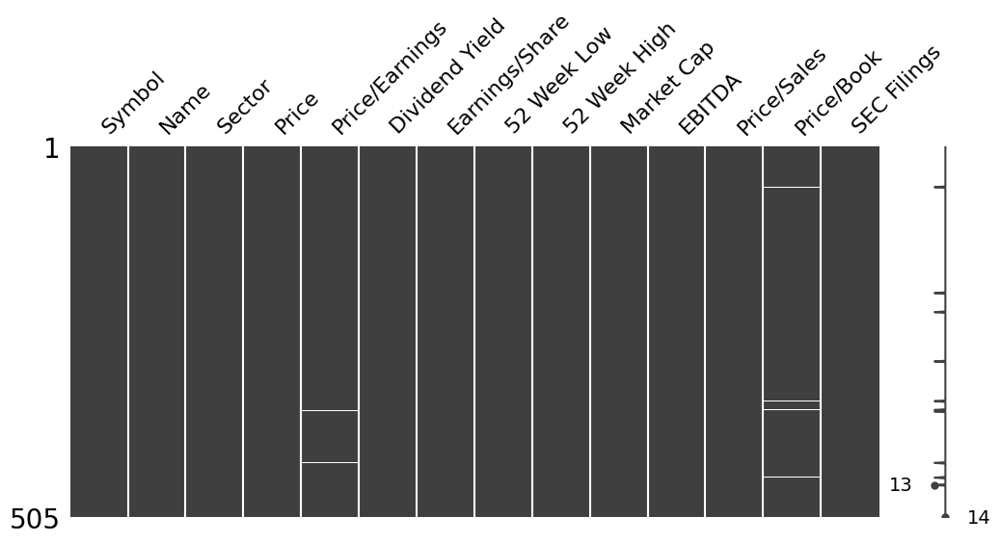

In [169]:
msno.matrix(df_, figsize=(12,5))

Дендрограмма

<Axes: >

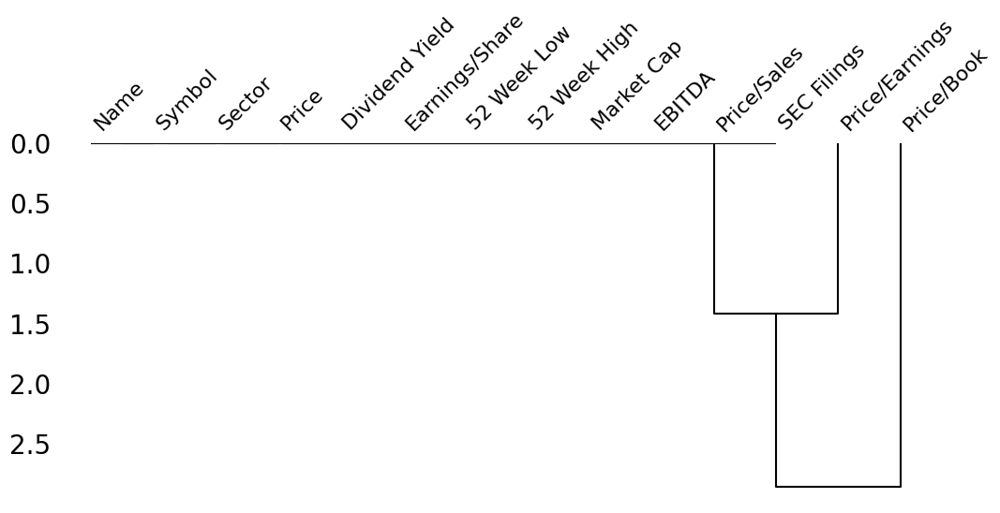

In [170]:
msno.dendrogram(df_, figsize=(12,5))

# Визуализация данных

## Категориальные признаки

C:\Users\maksi\AppData\Local\Temp\ipykernel_9468\62005786.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df_, x='Sector', palette="Blues_r")


Text(0, 0.5, 'Кол-во')

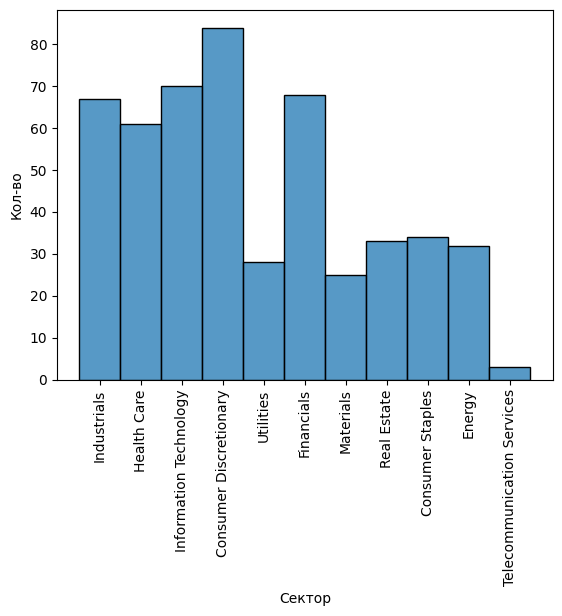

In [171]:
sns.histplot(data=df_, x='Sector', palette="Blues_r")
plt.xlabel("Сектор")
plt.xticks(rotation=90)
plt.ylabel("Кол-во")

## Числовые данные

# Обработка датасета

Дропаем: Symbol, Name, SEC Filings  
  
Кодируем: Sector (номинальный)

In [172]:
df_.head()

,Symbol,Name,Sector,Price,Price/Earnings,Dividend Yield,Earnings/Share,52 Week Low,52 Week High,Market Cap,EBITDA,Price/Sales,Price/Book,SEC Filings
0,MMM,3M Company,Industrials,222.89,24.31,2.332862,7.92,259.77,175.490,1.387211e+11,9.048000e+09,4.390271,11.34,http://www.sec.gov/cgi-bin/browse-edgar?action...
1,AOS,A.O. Smith Corp,Industrials,60.24,27.76,1.147959,1.70,68.39,48.925,1.078342e+10,6.010000e+08,3.575483,6.35,http://www.sec.gov/cgi-bin/browse-edgar?action...
2,ABT,Abbott Laboratories,Health Care,56.27,22.51,1.908982,0.26,64.60,42.280,1.021210e+11,5.744000e+09,3.740480,3.19,http://www.sec.gov/cgi-bin/browse-edgar?action...
3,ABBV,AbbVie Inc.,Health Care,108.48,19.41,2.499560,3.29,125.86,60.050,1.813863e+11,1.031000e+10,6.291571,26.14,http://www.sec.gov/cgi-bin/browse-edgar?action...
4,ACN,Accenture plc,Information Technology,150.51,25.47,1.714470,5.44,162.60,114.820,9.876586e+10,5.643228e+09,2.604117,10.62,http://www.sec.gov/cgi-bin/browse-edgar?action...


In [173]:
df = df_.drop(['Symbol', 'Name', 'SEC Filings'], axis=1)
df

,Sector,Price,Price/Earnings,Dividend Yield,Earnings/Share,52 Week Low,52 Week High,Market Cap,EBITDA,Price/Sales,Price/Book
0,Industrials,222.89,24.31,2.332862,7.92,259.77,175.490,1.387211e+11,9.048000e+09,4.390271,11.34
1,Industrials,60.24,27.76,1.147959,1.70,68.39,48.925,1.078342e+10,6.010000e+08,3.575483,6.35
2,Health Care,56.27,22.51,1.908982,0.26,64.60,42.280,1.021210e+11,5.744000e+09,3.740480,3.19
3,Health Care,108.48,19.41,2.499560,3.29,125.86,60.050,1.813863e+11,1.031000e+10,6.291571,26.14
4,Information Technology,150.51,25.47,1.714470,5.44,162.60,114.820,9.876586e+10,5.643228e+09,2.604117,10.62
...,...,...,...,...,...,...,...,...,...,...,...
500,Industrials,70.24,30.94,1.170079,1.83,76.81,46.860,1.291502e+10,7.220000e+08,2.726209,5.31
501,Consumer Discretionary,76.30,27.25,1.797080,4.07,86.93,62.850,2.700330e+10,2.289000e+09,6.313636,212.08
502,Health Care,115.53,14.32,0.794834,9.01,133.49,108.170,2.445470e+10,2.007400e+09,3.164895,2.39
503,Financials,50.71,17.73,1.480933,2.60,55.61,38.430,1.067068e+10,0.000000e+00,3.794579,1.42


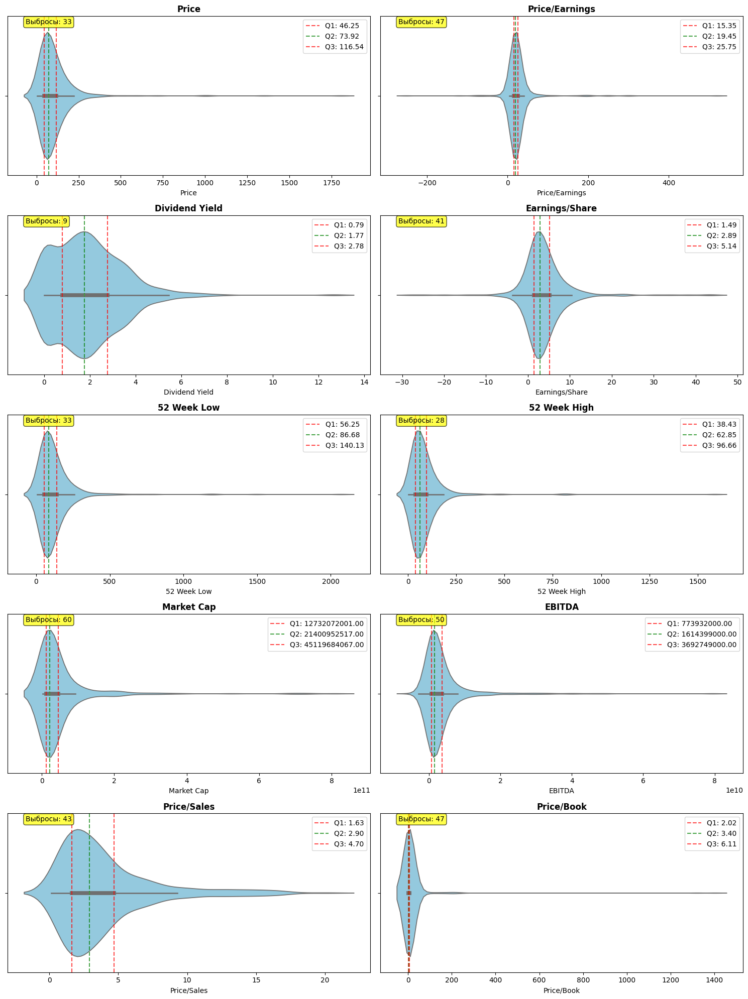

In [174]:
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()

for i, column in enumerate(df.columns.to_list()[1:]):
    sns.violinplot(x=df[column], ax=axes[i], color='skyblue')
    axes[i].set_title(f'{column}', fontweight='bold')
    axes[i].set_ylabel('')
    
    # Рассчитываем квантили
    Q1 = df[column].quantile(0.25)
    Q2 = df[column].quantile(0.5)  # медиана
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Добавляем вертикальные штриховые линии
    axes[i].axvline(x=Q1, color='red', linestyle='--', alpha=0.7, label=f'Q1: {Q1:.2f}')
    axes[i].axvline(x=Q2, color='green', linestyle='--', alpha=0.7, label=f'Q2: {Q2:.2f}')
    axes[i].axvline(x=Q3, color='red', linestyle='--', alpha=0.7, label=f'Q3: {Q3:.2f}')
    
    # Добавляем легенду
    axes[i].legend()
    
    # Добавляем аннотацию с количеством выбросов
    outliers = df[(df[column] < Q1 - 1.5*IQR) | (df[column] > Q3 + 1.5*IQR)]
    axes[i].text(0.05, 0.95, f'Выбросы: {len(outliers)}', 
                transform=axes[i].transAxes, bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

plt.tight_layout()
plt.show()

Посмотрим все записи с NaN

In [175]:
df[df.isna().any(axis=1)]

,Sector,Price,Price/Earnings,Dividend Yield,Earnings/Share,52 Week Low,52 Week High,Market Cap,EBITDA,Price/Sales,Price/Book
55,Industrials,24.45,20.21,0.956175,-0.21,31.17,21.755,1.212330e+10,1.517000e+09,0.942148,NaN
199,Consumer Discretionary,45.88,9.50,2.582795,4.91,77.86,28.420,5.819080e+09,9.570000e+08,1.036295,NaN
225,Health Care,95.97,14.07,1.422764,5.94,106.84,71.180,3.444905e+10,8.202000e+09,0.725192,NaN
292,Energy,15.68,-32.00,1.224740,-2.65,19.52,10.550,1.387501e+10,2.266000e+09,4.657876,NaN
346,Energy,68.47,195.63,4.408186,-0.75,78.09,57.200,5.346769e+10,5.205000e+09,6.044895,NaN
358,Consumer Staples,110.15,21.51,2.837004,4.36,122.51,104.770,1.614133e+11,1.284300e+10,3.670506,NaN
360,Health Care,84.44,NaN,0.731261,-28.01,95.93,63.680,1.232638e+10,0.000000e+00,3.385007,2.03
430,Consumer Discretionary,48.85,NaN,0.000000,2.09,50.71,36.690,1.424720e+10,0.000000e+00,4.078549,4.35
450,Industrials,283.00,23.76,0.000000,7.92,321.38,203.720,1.524120e+10,1.635916e+09,4.268832,NaN
460,Industrials,124.86,22.06,2.062655,13.52,143.05,101.060,1.015133e+11,1.016900e+10,4.860507,NaN


Кодирование категориального признака Sector, используем Binary Encoding

In [176]:
encoder = ce.BinaryEncoder(cols=['Sector'])
df_encoded = encoder.fit_transform(df)
df_encoded

,Sector_0,Sector_1,Sector_2,Sector_3,Price,Price/Earnings,Dividend Yield,Earnings/Share,52 Week Low,52 Week High,Market Cap,EBITDA,Price/Sales,Price/Book
0,0,0,0,1,222.89,24.31,2.332862,7.92,259.77,175.490,1.387211e+11,9.048000e+09,4.390271,11.34
1,0,0,0,1,60.24,27.76,1.147959,1.70,68.39,48.925,1.078342e+10,6.010000e+08,3.575483,6.35
2,0,0,1,0,56.27,22.51,1.908982,0.26,64.60,42.280,1.021210e+11,5.744000e+09,3.740480,3.19
3,0,0,1,0,108.48,19.41,2.499560,3.29,125.86,60.050,1.813863e+11,1.031000e+10,6.291571,26.14
4,0,0,1,1,150.51,25.47,1.714470,5.44,162.60,114.820,9.876586e+10,5.643228e+09,2.604117,10.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,0,0,0,1,70.24,30.94,1.170079,1.83,76.81,46.860,1.291502e+10,7.220000e+08,2.726209,5.31
501,0,1,0,0,76.30,27.25,1.797080,4.07,86.93,62.850,2.700330e+10,2.289000e+09,6.313636,212.08
502,0,0,1,0,115.53,14.32,0.794834,9.01,133.49,108.170,2.445470e+10,2.007400e+09,3.164895,2.39
503,0,1,1,0,50.71,17.73,1.480933,2.60,55.61,38.430,1.067068e+10,0.000000e+00,3.794579,1.42


Разделение данных и стандартизация

In [177]:
X = df_encoded.drop('Price', axis=1)
y = df_encoded[['Price']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=123)

imputer = SimpleImputer(strategy='median')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

Baseline

In [ ]:
# Создаем пайплайн
pipeline = make_pipeline(StandardScaler(), LinearRegression())

# Обучаем пайплайн
pipeline.fit(X_train_imputed, y_train)

# Создаем KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Выполняем кросс-валидацию
cv_metrics = cross_validate(
    estimator=pipeline,
    X=X_train_imputed,
    y=y_train,
    cv=kf,
    scoring='r2',
    return_train_score=True,
    n_jobs=-1
)

In [190]:
print(f"Среднее качество на тренировочной выборке: {cv_metrics['train_score'].mean()}")
print(f"Среднее качество на валидации: {cv_metrics['test_score'].mean()}")

Среднее качество на тренировочной выборке: 0.9870590966721678
Среднее качество на валидации: 0.9718531223172832


In [191]:
# Предсказываем значения
y_pred = pipeline.predict(X_test_imputed)

# Рассчитываем коэффициент детерминации
print(f"R^2 на тестовых данных: {r2_score(y_test, y_pred)}")

NotFittedError: Pipeline is not fitted yet.

In [181]:
train_sizes, train_scores, test_scores = learning_curve(pipeline, X_train_imputed, y_train)

In [182]:
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

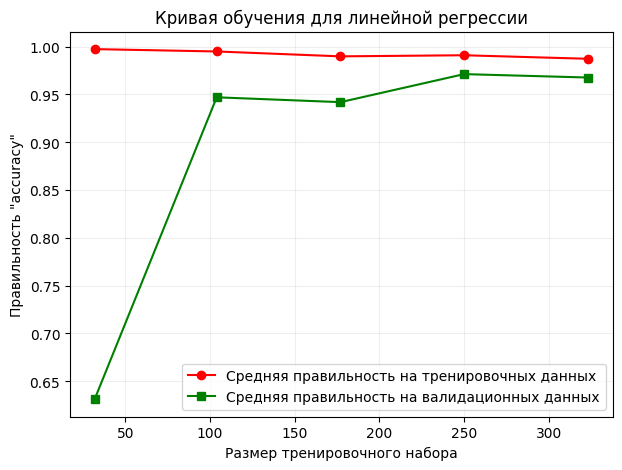

In [183]:
plt.figure(figsize=(7, 5))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r',label='Средняя правильность на тренировочных данных')
plt.plot(train_sizes, test_scores_mean, 's-', color='g',label='Средняя правильность на валидационных данных')
plt.title('Кривая обучения для линейной регрессии')
plt.xlabel('Размер тренировочного набора')
plt.ylabel('Правильность "accuracy"')
plt.legend()
plt.grid(alpha=0.2)

In [184]:
score, scores_permuted, p_value = permutation_test_score(pipeline, X_train_imputed, y_train,n_permutations=100,random_state=42,n_jobs=-1)

print(f'Оригинальная правильность: {score:.4f}', end='\n\n')
print(f'Правильность на перемешанных ответах: {scores_permuted}', end='\n\n')
print(f'Средняя правильность на перемешанных ответах: {scores_permuted.mean():.4f}', end='\n\n')
print(f'p-value: {p_value:.4f}')

Оригинальная правильность: 0.9677

Правильность на перемешанных ответах: [-0.07836543 -0.23887865 -0.07711336 -0.47345259 -0.09681078 -0.34386088
 -0.17137284 -0.11415998 -0.35404963 -0.11342022 -0.12085141 -0.21133215
 -0.04434767 -0.16602382 -0.09634589 -0.22841032 -0.06762327 -0.28430216
 -0.20087589 -0.07848021 -0.06140624 -0.59095079 -0.09679443 -0.08735578
  0.01119211 -0.13750749 -0.04436367 -0.36695901 -0.10871155 -0.04586921
 -0.16570043 -0.1641661  -0.11317865 -0.16992113 -0.05102935 -0.08001482
 -0.07163442 -0.1493491  -0.07691212 -0.18491759 -0.54280641 -0.10751957
 -0.16299753 -0.08281248 -0.22496063 -0.13813199 -3.28285926 -0.10682548
 -0.10912932 -0.1329569  -0.17827827 -0.15024782 -0.17846074 -0.37391262
 -0.07098837 -0.16753899 -1.44189528 -0.10914623 -0.08830425 -0.16305098
 -0.06741025 -0.08710682 -0.08780749 -0.30319391 -0.20078937 -0.16297789
 -0.1017683  -0.05482583 -0.16714744 -0.0766781  -0.07235323 -0.08603197
 -0.22974724 -0.22702918 -0.04614909 -0.09225525 -0

In [185]:
predictions = cross_val_predict(pipeline, X_train_imputed, y_train)
print(predictions, predictions.shape, sep='\n')

[[2.35710480e+02]
 [1.42888559e+02]
 [5.70531765e+01]
 [4.08434182e+01]
 [2.41407194e+02]
 [2.32834602e+02]
 [3.07558435e+01]
 [1.00759033e+02]
 [1.90148699e+02]
 [2.79577785e+01]
 [1.82125592e+01]
 [7.22794956e+01]
 [5.78886056e+01]
 [2.22932264e+02]
 [7.22978448e+01]
 [5.64455273e+01]
 [9.12956962e+01]
 [1.74784875e+01]
 [9.51254502e+01]
 [1.23051538e+02]
 [3.26944250e+01]
 [1.20239298e+02]
 [6.81881465e+01]
 [7.27746332e+01]
 [9.49134862e+01]
 [1.47169867e+02]
 [2.09240626e+01]
 [3.38624990e+01]
 [2.42322732e+01]
 [4.48540801e+01]
 [1.64331108e+01]
 [7.57181549e+01]
 [1.06650863e+02]
 [9.22102746e+01]
 [5.55572673e+01]
 [1.56358349e+02]
 [2.24915688e+02]
 [1.80709668e+02]
 [1.60008903e+01]
 [2.68456551e+01]
 [4.76694700e+01]
 [5.75118560e+01]
 [4.32852197e+01]
 [4.26292947e+01]
 [8.77655189e+01]
 [8.28303094e+01]
 [5.96776414e+01]
 [8.68983521e+01]
 [9.13987718e+01]
 [5.51723797e+01]
 [1.36772769e+02]
 [5.09092117e+01]
 [3.84872143e+01]
 [8.53755461e+01]
 [1.22529436e+02]
 [3.009080

In [186]:
pd.DataFrame(predictions)

,0
0,235.710480
1,142.888559
2,57.053176
3,40.843418
4,241.407194
...,...
399,27.384704
400,37.482396
401,69.588062
402,72.281013


In [187]:
# Предсказываем значения
y_pred = pipeline.predict(X_test_imputed)

# Рассчитываем коэффициент детерминации
print(f"R^2 на тестовых данных: {r2_score(y_test, y_pred)}")

R^2 на тестовых данных: 0.9982222958213418


In [196]:
MAE = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAE: {MAE}')
print(f'r2: {r2}')

MAE: 5.289767950513354
r2: 0.9982222958213418
